<a href="https://colab.research.google.com/github/mandraa/PVCK_Ganjil_2023/blob/main/week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama : Juniar Andra P

Kls  : TI3G

NIM  : 2141720214

In [7]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 Mengubah  tingkat kecerahan citra 
-----------------------------------
Masukkan nilai kecerahan: 50


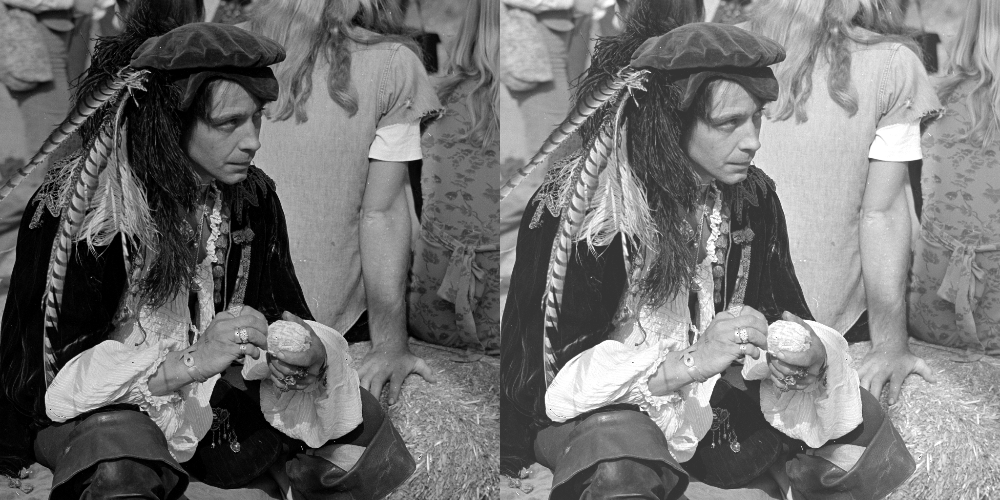

In [8]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np

print(' Mengubah  tingkat kecerahan citra ')
print('-----------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_2023/Images/male.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

 Inverse Citra 


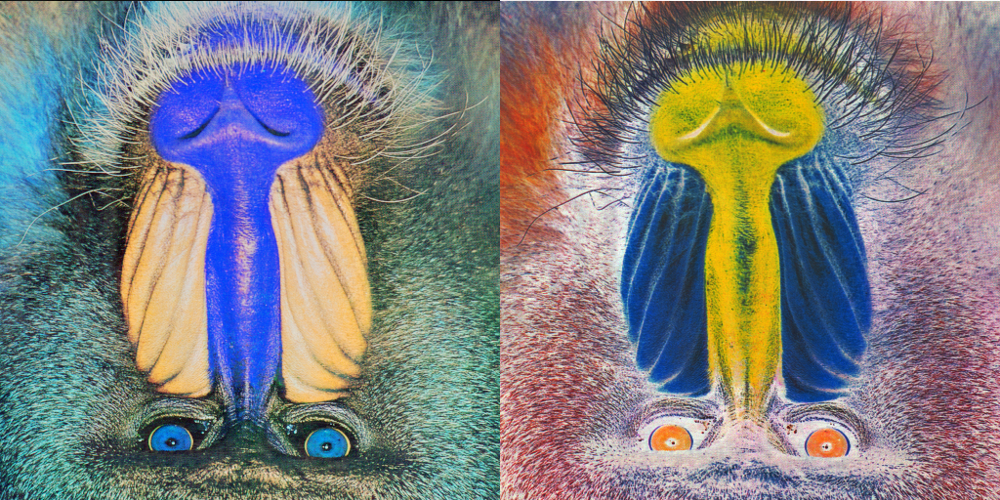

In [9]:
# Tugas 1
print(' Inverse Citra ')
print('===============')

#membaca citra sebagai array numpy
original = cv.imread('/content/drive/MyDrive/PCVK_2023/Images/mandrill2.tiff')

#menghitung citra negatif/inverse dengan rumus g(x) = 255 - f(x)
inverse_image = 255 - original

#menampilkan citra asli dan inverse
final_frame = cv.hconcat((original, inverse_image))
cv2_imshow(final_frame)


 Mengubah kontras dan tingkat kecerahan citra 
----------------------------------------------
Masukkan kontras [-255 - +255]: 200


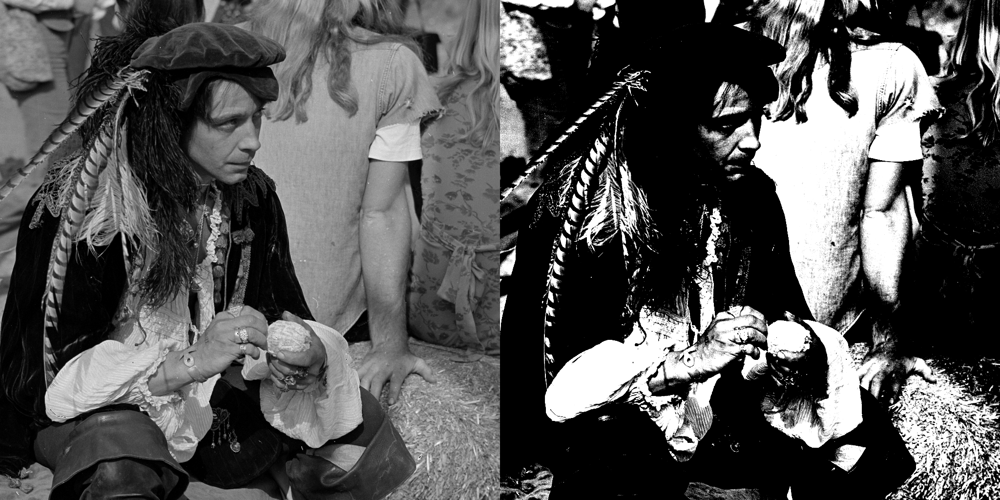

In [10]:
# Tugas 2
print(' Mengubah kontras dan tingkat kecerahan citra ')
print('----------------------------------------------')
try:
    contrast = float(input('Masukkan kontras [-255 - +255]: '))
except ValueError:
    print('Error, not a number')


original = cv.imread('/content/drive/MyDrive/PCVK_2023/Images/male.tiff')
contrast_image = np.zeros(original.shape, original.dtype)
F = (259*(contrast+255))/(255*(259-contrast))
#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            contrast_image[y,x,c] = np.clip((F*(original[y,x,c]-128))+128, 0, 255)

final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)

 Mengubah kontras warna dan tingkat kecerahan citra 
Masukkan nilai kecerahan: 50


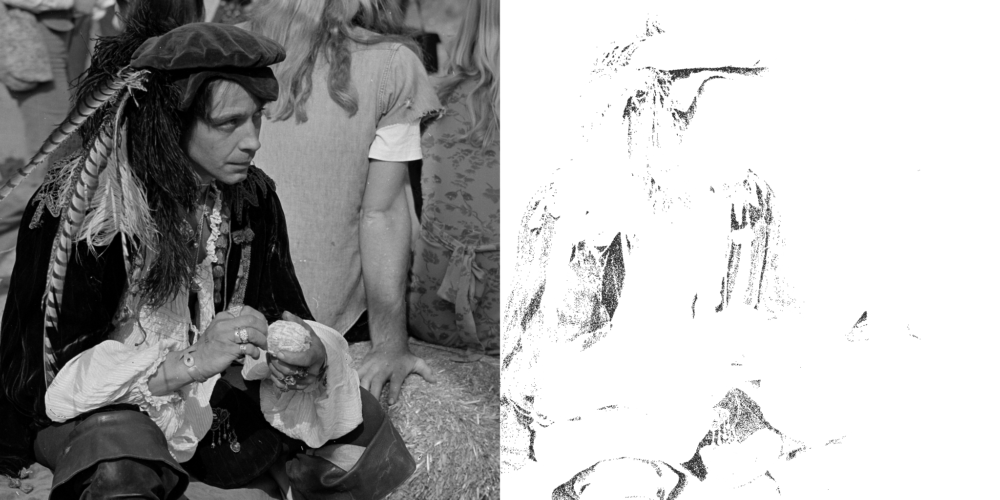

In [11]:
# Tugas 3
print(' Mengubah kontras warna dan tingkat kecerahan citra ')
print('====================================================')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

# try:
#   contrast = int(input('Masukkan tingkat kontras (1.0 - 3.0): '))
# except ValueError:
#   print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_2023/Images/male.tiff')

#mengubah kontras dan kecerahan dengan rumus
contrast_image = cv.convertScaleAbs(original, alpha=contrast, beta=brightness)

#menampilkan citra asli dan hasil
final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)

 Mengubah citra dengan transformasi grayscale menggunakan metode Averaging, Lightness, dan Luminance 
-----------------------------------------------------------------------------------------------------


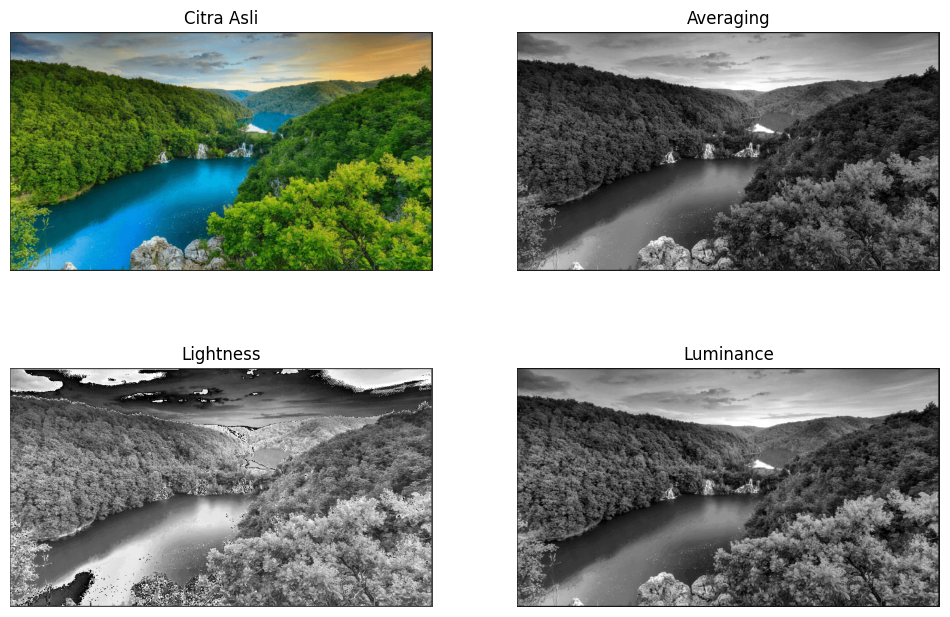

In [13]:
# Tugas 4
import matplotlib.pyplot as plt

print(' Mengubah citra dengan transformasi grayscale menggunakan metode Averaging, Lightness, dan Luminance ')
print('-----------------------------------------------------------------------------------------------------')

original = cv.imread('/content/drive/MyDrive/PCVK_2023/Images/jungle.png')

#mengubah citra ke RGB
original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

#menghitung nilai piksel baru dengan metode averaging
averaging = np.mean(original, axis=2)

#menghitung nilai piksel baru dengan metode lightness
min = np.min(original, axis=2)
max = np.max(original, axis=2)
lightness = (min + max) / 2

#menghitung nilai piksel baru dengan metode luminance
luminance = 0.21 * original[:,:,0] + 0.72 * original[:,:,1] + 0.07 * original[:,:,2]

#menampilkan citra asli dan hasil
plt.figure(figsize=(12, 8))   #Fungsi plt.figure adalah untuk membuat sebuah objek figure, yaitu wadah untuk menampilkan satu atau lebih subplot. Fungsi ini dapat menerima beberapa argumen, salah satunya adalah figsize yang menentukan ukuran figure dalam inci.
plt.subplot(221)    #Fungsi plt.subplot adalah untuk membuat sebuah objek axes, yaitu area untuk menampilkan plot. Fungsi ini menerima tiga argumen, yaitu nrows, ncols, dan index yang menentukan posisi subplot dalam grid. Pada plt.subplot(221) berarti membuat subplot di posisi pertama dari grid 2x2.
plt.imshow(original)
plt.title('Citra Asli')
plt.axis('off')
plt.subplot(222)
plt.imshow(averaging, cmap='gray')
plt.title('Averaging')
plt.axis('off')
plt.subplot(223)
plt.imshow(lightness, cmap='gray')
plt.title('Lightness')
plt.axis('off')
plt.subplot(224)
plt.imshow(luminance, cmap='gray')
plt.title('Luminance')
plt.axis('off')
plt.show()

 Menampilkan warna biru pada citra masukan dan mengubah bagian lain yang tidak berwarna biru menjadi grayscale 


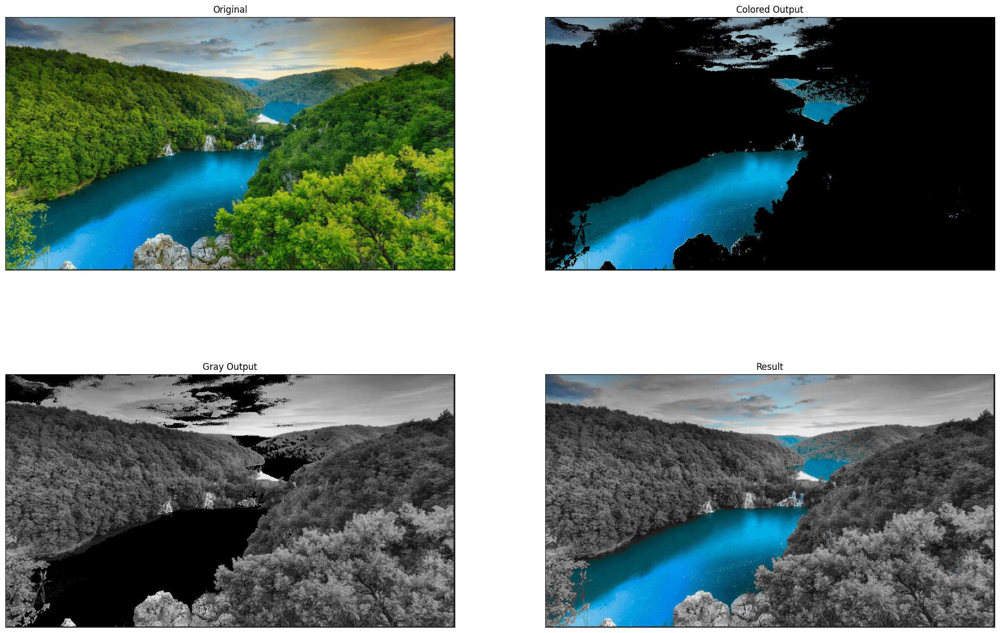

In [15]:
# Tugas 5
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

print(' Menampilkan warna biru pada citra masukan dan mengubah bagian lain yang tidak berwarna biru menjadi grayscale ')
print('===============================================================================================================')

original = cv.imread('/content/drive/MyDrive/PCVK_2023/Images/jungle.png')

# Ubah gambar dari BGR ke RGB
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Ubah gambar ke grayscale dan gabungkan channelnya
gray = cv.cvtColor(original, cv.COLOR_BGR2GRAY)
gray = cv.merge([gray, gray, gray])

# Ubah gambar ke ruang warna HSV
hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

# Tentukan batas untuk warna biru dalam ruang warna HSV
lower = np.array([90, 50, 50])
upper = np.array([130, 255, 255])

# Buat mask untuk warna biru
mask = cv.inRange(hsv, lower, upper)

# Ambil bagian biru dari gambar
colored_output = cv.bitwise_and(original, original, mask=mask)

# Ubah bagian non-biru menjadi grayscale
gray_output = cv.bitwise_and(gray, gray, mask=255-mask)

# Gabungkan bagian biru
result = cv.add(colored_output, gray_output)

# Tampilkan gambar menggunakan matplotlib
fig, axes = plt.subplots(2, 2, figsize=(24, 16))

axes[0, 0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
axes[0, 0].set_title('Original')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv.cvtColor(colored_output, cv.COLOR_BGR2RGB))
axes[0, 1].set_title('Colored Output')
axes[0, 1].axis('off')

axes[1, 0].imshow(cv.cvtColor(gray_output, cv.COLOR_BGR2RGB))
axes[1, 0].set_title('Gray Output')
axes[1, 0].axis('off')

axes[1, 1].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
axes[1, 1].set_title('Result')
axes[1, 1].axis('off')

plt.show()